# **Plant Seedlings Classification**

## **Introduction**
Welcome to the Plant Seedlings Classification project, a fascinating journey into the realm of agricultural data science. In this Jupyter Notebook, we aim to guide you through a comprehensive yet intuitive exploration of machine learning, focusing on the classification of various plant seedlings. This project is particularly relevant for anyone interested in agriculture, botany, or environmental science.

## **About the Dataset**
Our dataset, known as the "V2 Plant Seedlings Dataset" from Kaggle which can be found [here](https://www.kaggle.com/datasets/vbookshelf/v2-plant-seedlings-dataset/data). The Dataset is a rich collection of 5,539 images featuring crop and weed seedlings at various growth stages. These images, presented in vibrant RGB format and varying sizes, are meticulously categorized into 12 distinct classes. Each class symbolizes a common plant species prevalent in Danish agriculture, capturing the diversity and complexity of plant growth stages.

## **Project Objective**
The criticality of weed control in agriculture cannot be overstated, particularly in the context of maize farming in regions like southern Africa. Effective weed control within the initial six to eight weeks post-planting is vital, as weeds aggressively compete with crops for nutrients and water during this phase. The presence of weeds can lead to significant yield losses, varying from 10% to an astounding 100%. Thus, early and accurate weed identification is crucial for efficient agricultural management.

In this project, we will leverage machine learning to develop a model that can accurately classify crop and weed seedlings. This model aims to aid farmers and agricultural experts in early weed detection, contributing to informed decision-making and effective crop management.

## **Our Approach**
We have structured this notebook into five key sections, each designed to progressively build your understanding and skills:

**1. Data Preparation:** Learn how to load, explore, and preprocess the dataset, preparing it for machine learning analysis.

**2. Model Building:** Dive into the process of selecting and constructing a machine learning model suitable for our classification task.

**3. Model Training and Validation:** Understand the intricacies of training the model on our dataset, followed by validation to assess its performance.

**4. Model Evaluation:** Evaluate the model's effectiveness using various metrics, gaining insights into its accuracy and areas for improvement.

**5. Results and Visualization:** Visualize the outcomes, interpreting the model's predictions and drawing meaningful conclusions.

## **Join Us**
Whether you're a student, a professional, or simply a curious learner, this project offers an engaging and informative experience. You are not just learning about machine learning, you are contributing to a real-world challenge in agriculture. Let's embark on this educational journey together, blending technology and nature to foster sustainable agricultural practices.

## **Step 1: Data Preparation**
This step involves loading the V2 Plant Seedlings Dataset, which contains 5,539 images of various crop and weed seedlings. We'll explore the images, grouped into 12 classes representing common Danish agricultural plant species, and preprocess them to ensure they are in a suitable format for our machine learning model.

In [1]:
# Mount Google Drive with Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Import necessary libraries
import os
import numpy as np
import pandas as pd
from skimage.io import imread
import matplotlib.pyplot as plt

In [3]:
# Path to the dataset directory
dataset_path = "/content/drive/MyDrive/PLANT_SEEDLINGS_CLASSIFICATION/INPUT_DATASET_2/nonsegmentedv2/"  # Update this path according to your dataset location

# List all subdirectories in the dataset directory
subfolders = [f.name for f in os.scandir(dataset_path) if f.is_dir()]
print("Categories:", subfolders)

Categories: ['Maize', 'Scentless Mayweed', 'Black-grass', 'Fat Hen', 'Small-flowered Cranesbill', 'Common wheat', 'Charlock', 'Loose Silky-bent', 'Common Chickweed', 'Shepherd’s Purse', 'Sugar beet', 'Cleavers']


In [4]:
# Define a function to load 3 images from each category
def load_sample_images(path, categories, num_samples=3):
    sample_images = {}
    for category in categories:
        folder_path = os.path.join(path, category)
        image_files = [file for file in os.listdir(folder_path) if file.endswith('.png')]
        sample_images[category] = [imread(os.path.join(folder_path, file)) for file in image_files[:num_samples]]
    return sample_images

In [5]:
# Load sample images
sample_images = load_sample_images(dataset_path, subfolders)

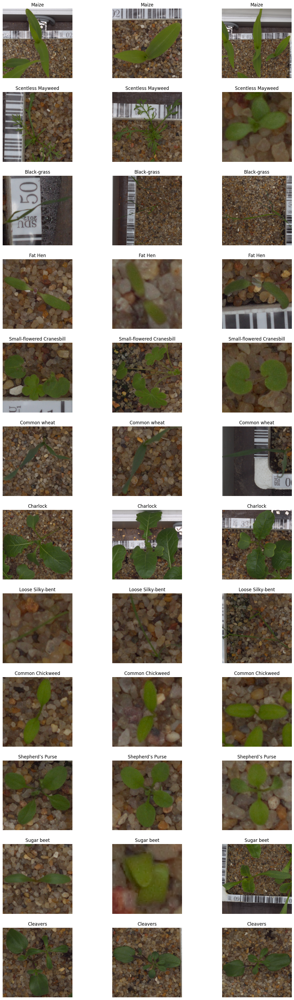

In [6]:
# Plotting
fig, axarr = plt.subplots(len(subfolders), 3, figsize=(15, 4 * len(subfolders)))
for i, category in enumerate(subfolders):
    for j in range(3):
        axarr[i, j].imshow(sample_images[category][j])
        axarr[i, j].axis('off')
        axarr[i, j].set_title(category)  # Set the title for each image

plt.show()

In [7]:
# Initialize lists to store data
images = []
categories = []

# Load images and their categories
for category in subfolders:
    folder_path = os.path.join(dataset_path, category)
    for file in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file)
        if file_path.endswith(".png"):
            img = imread(file_path)
            images.append(img)
            categories.append(category)

# Convert lists to numpy arrays
images = np.array(images)
categories = np.array(categories)

<ipython-input-7-1b10c83c943d>:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  images = np.array(images)


In this step, we successfully loaded the V2 Plant Seedlings Dataset, containing images of various crop and weed seedlings. We explored the basic properties of the dataset, including the number of images, their dimensions, and the different categories represented by the subfolders. This exploration provided us with a foundational understanding of the data we will be working with. The images were visualized to give us a glimpse of the different plant seedlings we aim to classify.

Next, we will proceed to Step 2: Model Building, where we will select and set up a suitable machine learning model for our classification task.

## **Step 2: Model Building**
In this phase, we select and construct a machine learning model. We'll use a pre-trained PyTorch model, such as ResNet18, and adapt it to our specific task of classifying plant seedlings. This involves setting up the model architecture and configuring it for our classification problem.

In [8]:
# Import necessary libraries
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
from torchvision.datasets import ImageFolder
import torch.optim as optim

In [9]:
# Check if GPU is available and set the device accordingly
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Define image transformations
transform = transforms.Compose([
    transforms.Resize(size=(224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),               # Convert images to Tensor
    transforms.Normalize(                # Normalize the images
        mean=[0.485, 0.456, 0.406],      # Mean and Std for ImageNet dataset
        std=[0.229, 0.224, 0.225]
    )
])

# Load the dataset and apply transformations
dataset_path = "/content/drive/MyDrive/PLANT_SEEDLINGS_CLASSIFICATION/INPUT_DATASET_2/nonsegmentedv2/"
dataset = ImageFolder(root=dataset_path, transform=transform)

In [10]:
# # Split dataset into training and validation sets
# train_size = int(0.7 * len(dataset))
# validation_size = len(dataset) - train_size
# train_dataset, validation_dataset = random_split(dataset, [train_size, validation_size])

In [11]:
# Split dataset into training+validation set and test set
train_val_size = int(0.8 * len(dataset))  # 80% for training + validation
test_size = len(dataset) - train_val_size
train_val_dataset, test_dataset = random_split(dataset, [train_val_size, test_size])

# Split training+validation set into training set and validation set
train_size = int(0.7 * len(train_val_dataset))  # 70% of train_val_dataset for training
validation_size = len(train_val_dataset) - train_size
train_dataset, validation_dataset = random_split(train_val_dataset, [train_size, validation_size])

In [12]:
# Create data loaders
batch_size = 32  # Adjust as needed
train_loader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True)
validation_loader = DataLoader(validation_dataset, batch_size = batch_size)
test_loader = DataLoader(test_dataset, batch_size = batch_size)

In [13]:
# Load a pre-trained model, in this case, ResNet18
model = models.resnet18(pretrained = True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 113MB/s]


In [14]:
# Modify the last fully connected layer to match the number of classes
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 12)  # Assuming 12 classes in your dataset

In [15]:
# Move the model to the chosen device (GPU or CPU)
model = model.to(device)

In [16]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)  # Learning rate can be adjusted

In [17]:
# Display the model structure (optional)
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

With the successful completion of Step 2, "Model Building," we have now established a foundation for our Plant Seedlings Classification project. Our model architecture is in place, equipped with the necessary transformations, data loaders, loss function, and optimizer. As we transition into Step 3, "Model Training and Validation," we are poised to bring our model to life. This next phase will involve training the model on our curated dataset, fine-tuning its parameters, and validating its performance to ensure it accurately classifies the various plant seedlings.

## **Step 3: Model Training and Validation**
Here, we train the model on our preprocessed dataset. The process includes feeding the data into the model, adjusting model weights using a chosen loss function, and employing an optimizer. Concurrently, we validate the model's performance on a separate subset of the dataset to ensure its effectiveness and generalizability.

In [18]:
# Additional imports
from torch.optim import lr_scheduler
import time
import copy
import tqdm

In [19]:
# Number of epochs to train for
num_epochs = 25

# Learning rate scheduler
scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [20]:
# Initialize variables to store performance metrics
train_losses, val_losses = [], []
train_accs, val_accs = [], []

def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # Backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train' and scheduler:
                scheduler.step()

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            # Save the metrics
            if phase == 'train':
                train_losses.append(epoch_loss)
                train_accs.append(epoch_acc.cpu().item())  # Detach from GPU and convert to Python number
            else:
                val_losses.append(epoch_loss)
                val_accs.append(epoch_acc.cpu().item())  # Detach from GPU and convert to Python number

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # Deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')

    # Load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [21]:
# Prepare the dataloaders
dataloaders = {'train': train_loader, 'val': validation_loader}

In [22]:
# Train and validate the model
model_ft = train_model(model, criterion, optimizer, scheduler, num_epochs=num_epochs)

Epoch 1/25
----------
train Loss: 0.8706 Acc: 0.7145
val Loss: 1.4986 Acc: 0.6471

Epoch 2/25
----------
train Loss: 0.4899 Acc: 0.8330
val Loss: 0.3861 Acc: 0.8649

Epoch 3/25
----------
train Loss: 0.3101 Acc: 0.8909
val Loss: 0.5583 Acc: 0.7958

Epoch 4/25
----------
train Loss: 0.2409 Acc: 0.9118
val Loss: 0.4543 Acc: 0.8393

Epoch 5/25
----------
train Loss: 0.2255 Acc: 0.9205
val Loss: 0.6662 Acc: 0.8018

Epoch 6/25
----------
train Loss: 0.2351 Acc: 0.9157
val Loss: 0.4988 Acc: 0.8266

Epoch 7/25
----------
train Loss: 0.2544 Acc: 0.9118
val Loss: 0.2725 Acc: 0.9084

Epoch 8/25
----------
train Loss: 0.0916 Acc: 0.9675
val Loss: 0.1694 Acc: 0.9422

Epoch 9/25
----------
train Loss: 0.0533 Acc: 0.9826
val Loss: 0.1595 Acc: 0.9392

Epoch 10/25
----------
train Loss: 0.0441 Acc: 0.9897
val Loss: 0.1765 Acc: 0.9437

Epoch 11/25
----------
train Loss: 0.0320 Acc: 0.9936
val Loss: 0.1653 Acc: 0.9474

Epoch 12/25
----------
train Loss: 0.0288 Acc: 0.9939
val Loss: 0.1795 Acc: 0.9422

E

In [23]:
# Save the best model
torch.save(model_ft.state_dict(), '/content/drive/MyDrive/PLANT_SEEDLINGS_CLASSIFICATION/TRAINED_MODEL/plant-seedlings_model_2.pth')

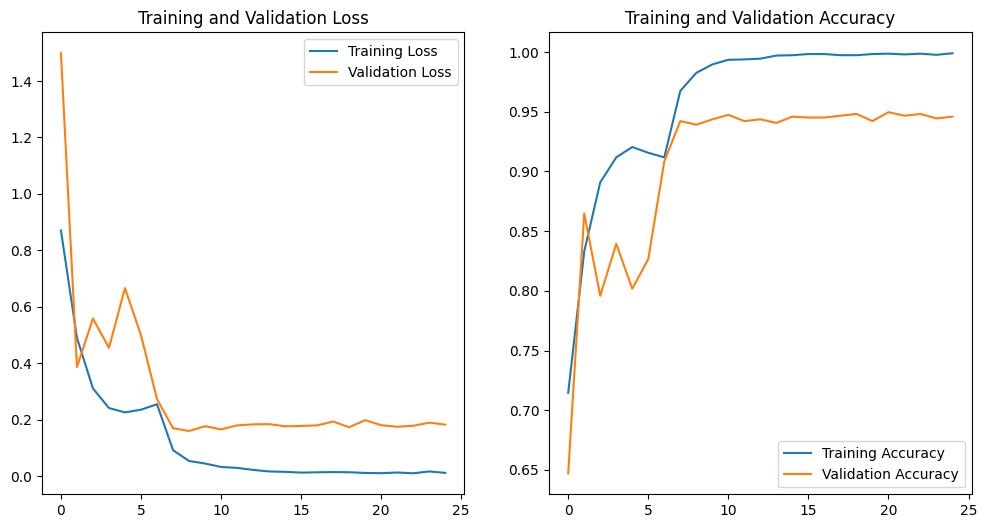

In [25]:
# Plotting training and validation losses
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label = 'Training Loss')
plt.plot(val_losses, label = 'Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting training and validation accuracies
plt.subplot(1, 2, 2)
plt.plot(train_accs, label = 'Training Accuracy')
plt.plot(val_accs, label = 'Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.show()

We have successfully completed Step 3, "Model Training and Validation", where our model underwent rigorous training and fine-tuning on the Plant Seedlings dataset. With the training phase concluded, marked by the evaluation of loss and accuracy trends, we are now poised to embark on Step 4, "Model Evaluation". This step will focus on thoroughly assessing the performance of our trained model, using various evaluation metrics to ensure its reliability and accuracy in classifying plant seedlings.

## **Step 4: Model Evaluation**
After training, the model's performance is evaluated using metrics like accuracy, precision, and recall. This step is crucial for assessing the model's ability to classify the plant seedlings correctly and identifying any areas that may require improvement.

In [26]:
# Import necessary libraries
import torch
import itertools
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

In [27]:
# Function to plot confusion matrix
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [28]:
# Evaluate the model
model_ft.eval()  # Set model to evaluation mode

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [29]:
# Initialize variables
y_true = []
y_pred = []

test_loader = DataLoader(test_dataset, batch_size = batch_size)

# Iterate over the data in the test loader
for inputs, labels in  test_loader:
    inputs = inputs.to(device)
    labels = labels.to(device)

    # Forward pass
    outputs = model_ft(inputs)
    _, preds = torch.max(outputs, 1)

    y_true.extend(labels.cpu().numpy())
    y_pred.extend(preds.cpu().numpy())

# Calculate metrics
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=subfolders))

Classification Report:

                           precision    recall  f1-score   support

                    Maize       0.69      0.72      0.70        61
        Scentless Mayweed       0.98      0.99      0.98        89
              Black-grass       1.00      0.97      0.99        73
                  Fat Hen       0.98      0.98      0.98       132
Small-flowered Cranesbill       0.96      0.92      0.94        49
             Common wheat       0.99      0.96      0.98       108
                 Charlock       0.89      0.90      0.89       162
         Loose Silky-bent       0.96      0.98      0.97        51
         Common Chickweed       0.92      0.98      0.95       125
         Shepherd’s Purse       0.98      0.91      0.95        67
               Sugar beet       1.00      1.00      1.00       100
                 Cleavers       0.95      0.92      0.93        93

                 accuracy                           0.94      1110
                macro avg       0.94

Normalized confusion matrix


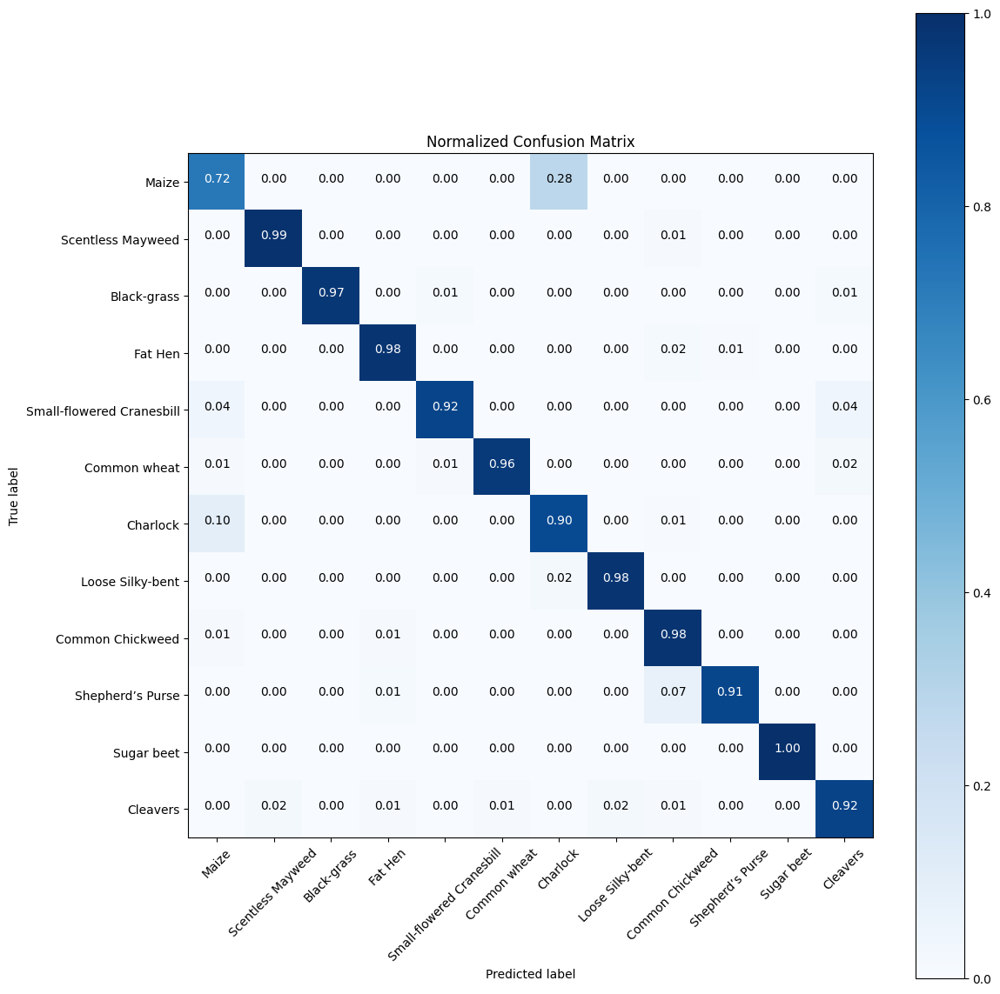

In [30]:
# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(12, 12))
plot_confusion_matrix(cm, classes=subfolders, normalize=True, title='Normalized Confusion Matrix')

plt.show()

Having successfully completed Step 4, "Model Evaluation," we have meticulously assessed our model's performance, gaining valuable insights through various metrics and analyses. As we now transition to the final phase of our Plant Seedlings Classification project, Step 5, "Results and Visualization," we are poised to delve into a comprehensive exploration of our results. This concluding phase will focus on visualizing and interpreting the outcomes of our model, providing a clear and engaging representation of our findings.

## **Step 5: Results and Visualization**
Finally, we present the results of our model. This includes visualizing the model's predictions on seedling images, interpreting the performance metrics, and using tools like LIME for explainable AI. This helps us understand the model's decision making process and provides insights into its effectiveness in classifying different plant seedlings.

In [33]:
import numpy as np

# Function to display an image
def imshow(inp, ax=None, title=None):
    """Imshow for Tensor."""
    if ax is None:
        _, ax = plt.subplots(1)
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    ax.imshow(inp)
    if title is not None:
        ax.set_title(title)
    ax.grid(False)
    ax.axis('off')

In [34]:
# Results and Visualization for All Classes for Test Set
def visualize_classes(model, num_samples_per_class = 3):
    class_images = {category: 0 for category in subfolders}
    fig, axes = plt.subplots(len(subfolders), num_samples_per_class, figsize=(15, 5 * len(subfolders)))

    model.eval()
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            probabilities = torch.nn.functional.softmax(outputs, dim = 1)

            for i in range(inputs.size()[0]):
                label = subfolders[labels[i]]
                if class_images[label] < num_samples_per_class:
                    ax = axes[subfolders.index(label), class_images[label]]
                    imshow(inputs.cpu().data[i], ax=ax)
                    ax.set_title(f'Ground Truth: {label}\nPrediction: {subfolders[preds[i]]} ({probabilities[i][preds[i]]:.2f})')
                    class_images[label] += 1

                if all(value >= num_samples_per_class for value in class_images.values()):
                    plt.tight_layout()
                    plt.show()
                    return

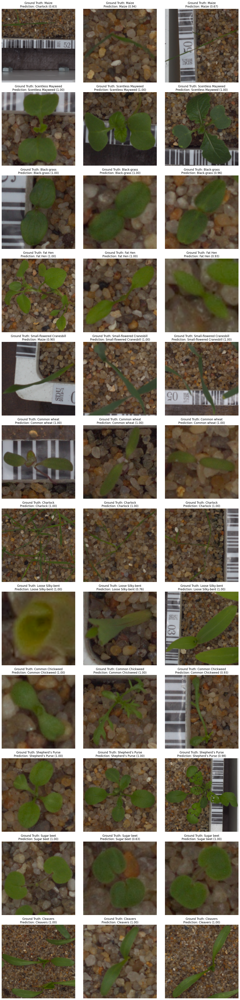

In [35]:
visualize_classes(model_ft)

With the successful visualization and examination of our model's predictions across all classes, we have now reached the end of our Machine Learning project on Plant Seedlings Classification. This journey, from data preparation and model building to training, evaluation, and detailed visual insights, has led to a comprehensive understanding and effective application of machine learning techniques. We proudly conclude this project, opening doors to innovative agricultural solutions.

# **The End**